# Better pipeline components

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

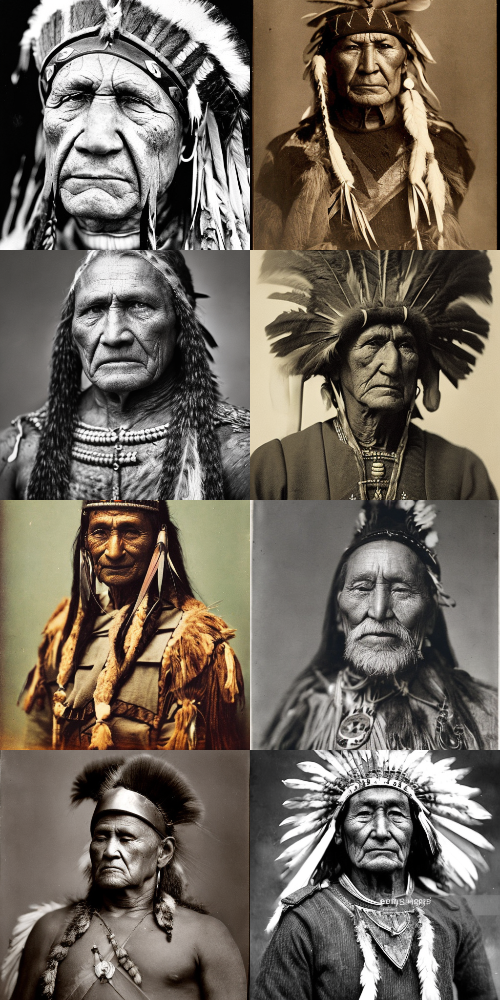

In [2]:
import torch
from diffusers import DiffusionPipeline, AutoencoderKL
from diffusers.utils import make_image_grid

def get_inputs(batch_size=1):
    generator = [torch.Generator("cuda").manual_seed(i) for i in range(batch_size)]
    prompts = batch_size * [prompt]
    num_inference_steps = 20

    return {"prompt": prompts, "generator": generator, "num_inference_steps": num_inference_steps}

prompt = "portrait photo of a old warrior chief"

model_id = "/data/duantong/mazipei/HuggingFace-Download-Accelerator/data/hf_cache/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/f03de327dd89b501a01da37fc5240cf4fdba85a1"
pipeline = DiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16, use_safetensors=True, variant="fp16")
pipeline = pipeline.to("cuda")

vae = AutoencoderKL.from_pretrained("/data/duantong/mazipei/HuggingFace-Download-Accelerator/data/hf_cache/hub/models--stabilityai--sd-vae-ft-mse/snapshots/31f26fdeee1355a5c34592e401dd41e45d25a493", torch_dtype=torch.float16).to("cuda")
pipeline.vae = vae
images = pipeline(**get_inputs(batch_size=8)).images
make_image_grid(images, 4, 2)

# Better prompt engineering

  0%|          | 0/20 [00:00<?, ?it/s]

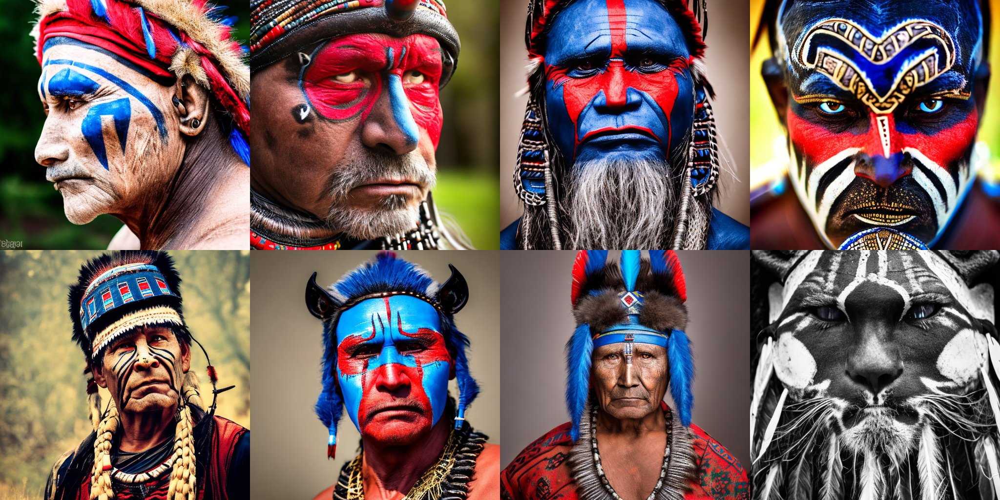

In [4]:
prompt += ", tribal panther make up, blue on red, side profile, looking away, serious eyes"
prompt += " 50mm portrait photography, hard rim lighting photography--beta --ar 2:3  --beta --upbeta"
images = pipeline(**get_inputs(batch_size=8)).images
make_image_grid(images, 2, 4)

  0%|          | 0/25 [00:00<?, ?it/s]

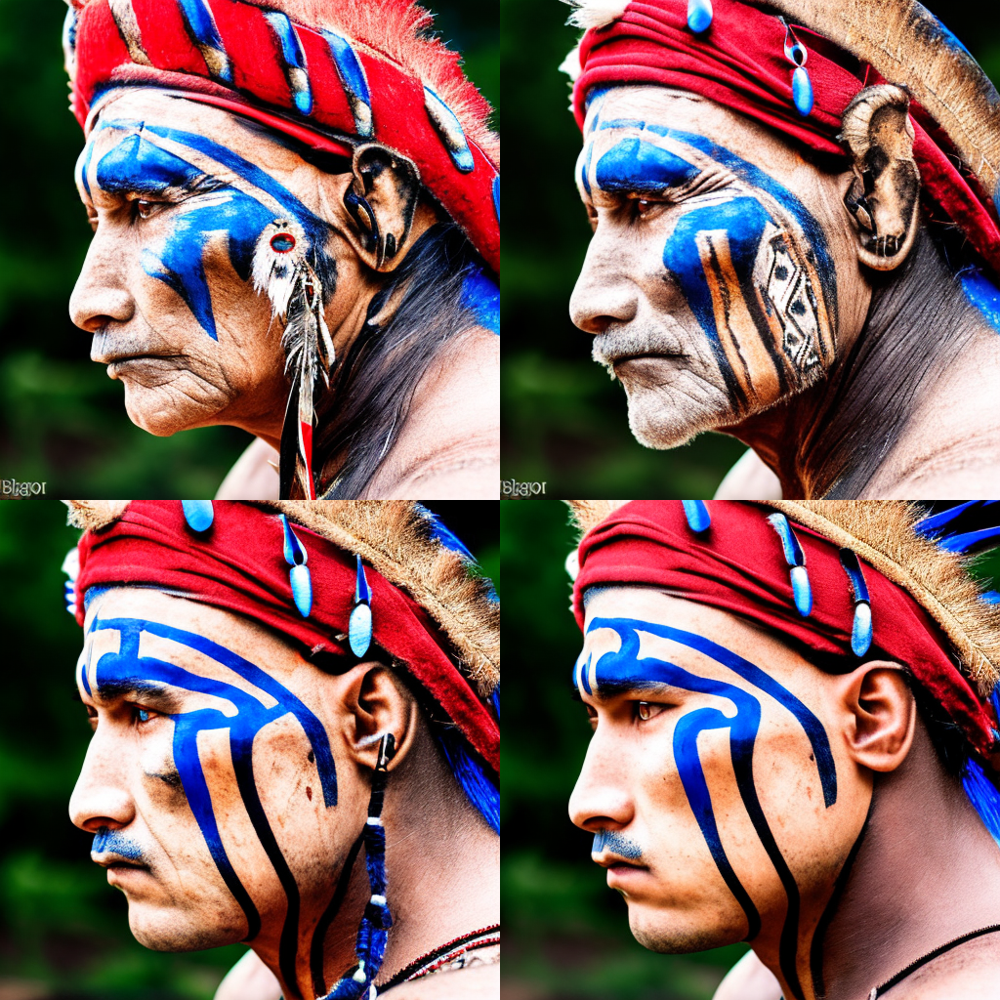

In [6]:
prompts = [
    "portrait photo of the oldest warrior chief, tribal panther make up, blue on red, side profile, looking away, serious eyes 50mm portrait photography, hard rim lighting photography--beta --ar 2:3  --beta --upbeta",
    "portrait photo of an old warrior chief, tribal panther make up, blue on red, side profile, looking away, serious eyes 50mm portrait photography, hard rim lighting photography--beta --ar 2:3  --beta --upbeta",
    "portrait photo of a warrior chief, tribal panther make up, blue on red, side profile, looking away, serious eyes 50mm portrait photography, hard rim lighting photography--beta --ar 2:3  --beta --upbeta",
    "portrait photo of a young warrior chief, tribal panther make up, blue on red, side profile, looking away, serious eyes 50mm portrait photography, hard rim lighting photography--beta --ar 2:3  --beta --upbeta",
]
generator = [torch.Generator("cuda").manual_seed(0) for _ in range(len(prompts))]
images = pipeline(prompt=prompts, generator=generator, num_inference_steps=25).images
make_image_grid(images, 2, 2)